# Steeter-Phelps Model
This report applies the Streeter–Phelps model to simulate dissolved oxygen and biochemical oxygen demand dynamics in the Wakenitz River. While the model effectively demonstrates theoretical oxygen sag behavior, its assumptions limit its applicability to the Wakenitz due to the river’s short length and hydrological variability. An interactive version of the model was developed to explore parameter sensitivity and enhance educational value

Hendrik Epping #392116

# Introduction

Dissolved oxygen (DO) is a critical component of the health of an aquatic ecosystem. The introduction of organic wastes into waterways acts as a food source for microorganisms that simultaneously reduce the DO. The biochemical oxygen demand (BOD) is a measure of the amount of organic waste present in a water sample. The Streeter–Phelps model is often used to describe how DO and BOD change with distance in a river or stream due to degradation of BOD and re-aeration from the atmosphere. It is a useful to predict how pollution impacts the oxygen levels in rivers, which is a critical measure of water quality. It predicts the oxygen sag curve, it showes where disoslved oxygen drops due to organic pollution and when recovery begin, helping to pinpoint enviromental stress zones. IT can help stakeholder to evaluate the impact of wastewater in a water body

# State of the art

The equation was originally derived in 1925 by H. W. Streeter, a sanitary engineer, and Earle B. Phelps, a consultant for the U.S. Public Health Service, based on field data collected from the Ohio River.
The author of this Streeter-Phelps model is David Lampert an associate Professor at Illinois Institute of Technology in Chicago, U.S.A.
He performs research on wastewater treatment processes, studies how contaminants move in the environment, and analyzes the interconnections between food, energy, climate, and water resources. Furthermore, he develops quantitative approaches to enhance the security and sustainability of water supplies. 
Besides the Streeter-Phelps model he also created PyHSPF whichis a Python-based interface and toolkit that enhances the classic Hydrological Simulation Program in Fortran (HSPF). Furthermore he also developed a ColumnTracer which is a  of a Jupyter notebook that contains Python code to calculate values from an analytical solution to the one-dimensional advection-diffusion equation. The model describes the transport of a non-reactive tracer through a column.



# Methodology

This code was created in Jupyter lab notebook 3.12.9 | packaged by conda-forge | (main, Mar  4 2025, 22:37:18) [MSC v.1943 64 bit (AMD64)].

The model relates the DO concentration $C$ and BOD concentrations $L$ at location $x$ downstream from a point source of BOD as follows:

$$
C(x)=C_{s} - \left[  \frac{k_{d}L_{0}}{k_{r}-k_{d}} ( e^{\frac{-k_{d}x}{U}} - e^{\frac{-k_{r}x}{U}} ) + ( C_{s} - C_{0} ) e^{\frac{-k_{r}x}{U}} \right]
$$

$$
L(x)=L_{0}e^{ \frac{-k_{d}x}{U}}
$$

$$
x_{crit} = \frac{U}{k_r - k_d} \cdot \ln\left( \frac{k_r}{k_d} \right)
$$

| Parameter |  Symbol | Unit|
|:----------|:-------------|:---|
| Saturated DO concentration  |  $C_{s}$ |  mg/L |
| Initial DO concentration |  $C_{0}$ |  mg/L | 
| Initial BOD concentration |  $L_{0}$ |  mg/L |
| BOD degradation rate | $k_{d}$|  hr$^{-1}$ |
| Oxygen re-aeration rate |$k_{r}$ |  hr$^{-1}$ |
| River velocity |$U$ | km/hr |
| Critical point, where DO is at mininmum |$x_{crit}$ | km |
### Paramter explanation

**Saturated DO concentration** is the maximum possible dissolved oxygen concentration the water can hold at equilibrium with the atmosphere. It depends on temperature, atmospheric pressure, salinity, and other environmental factors.

**Initial DO concentration**is the dissolved oxygen concentration in the river right at the point where the wastewater or pollutant enters the stream. It reflects the actual oxygen level in the water immediately downstream of the pollution source.

**Initial BOD concentration** is the Biological Oxygen Demand concentration in the river right at the point where the wastewater or pollutant enters the stream. It reflects the actual BOD level in the water immediately downstream of the pollution source.

**BOD degradation rate** is the rate coefficient of biochemical decomposition of organic matter, the BOD decay rate. 

**Oxygen re-aeration rate** is the reaeration rate coefficient, the rate at which oxygen enters the water from the atmosphere.

**River velocity** is the flowing speed of the river.

### Equation explanation
First the max level of DO what the water body can hold is introduced:
$$
C_s 
$$
From this the Oxygen deficit term is substracted, which models the oxygen loss dur to microbial breakdown of BOD, this causes the DO to sag:

$$
 \left[  \frac{k_d L_0}{k_r - k_d} \left( e^{\frac{-k_d x}{U}} - e^{\frac{-k_r x}{U}} \right) \right]
$$

Then the rearation recovery term is introducide, this describes how the water absorbs oxygen from the atmospher as it flows:
$$
\left[ \frac{k_d L_0}{k_r - k_d} \left( e^{\frac{-k_d x}{U}} - e^{\frac{-k_r x}{U}} \right) + ( C_s - C_0 ) e^{\frac{-k_r x}{U}} \right]
$$

To model the BOD concentration at distance x downstreams this equation is used:
$$
L(x)=L_{0}e^{ \frac{-k_{d}x}{U}}
$$
As you move downstream, BOD concentration drops exponentially. Microorganisms consume organic matter, which reduces BOD and the faster the flow or the higher $𝑘_𝑑$, the quicker it fades.


The distance downstream where dissolved oxygen reaches its minimum is derivedfrom the Streeter-Phelps equation to:
$$
x_{crit} = \frac{U}{k_r - k_d} \cdot \ln\left( \frac{k_r}{k_d} \right)
$$


# Case study Wakenitz

The Wakenitz is a small river in northern Germany that forms part of the border between the federal states of Schleswig-Holstein and Mecklenburg-Vorpommern. It originates from Lake Ratzeburg (Ratzeburger See) in the south and flows northward, eventually merging with the Trave River in the city of Lübeck. Although the river spans only approximately 14 kilometers, it plays a vital ecological and hydrological role in the region. 
The Wakenitz basin covers an area of roughly 250 km², characterized predominantly by agricultural land and forests, with urbanized and rural settlements concentrated in the northern part near Lübeck (Figure 1). The river runs in proximity to several protected Natura 2000 areas, including the Herrnburger Dünen and the Schaalsee-Gebiet, though the Wakenitz itself is not directly covered under EU habitat protection directives.

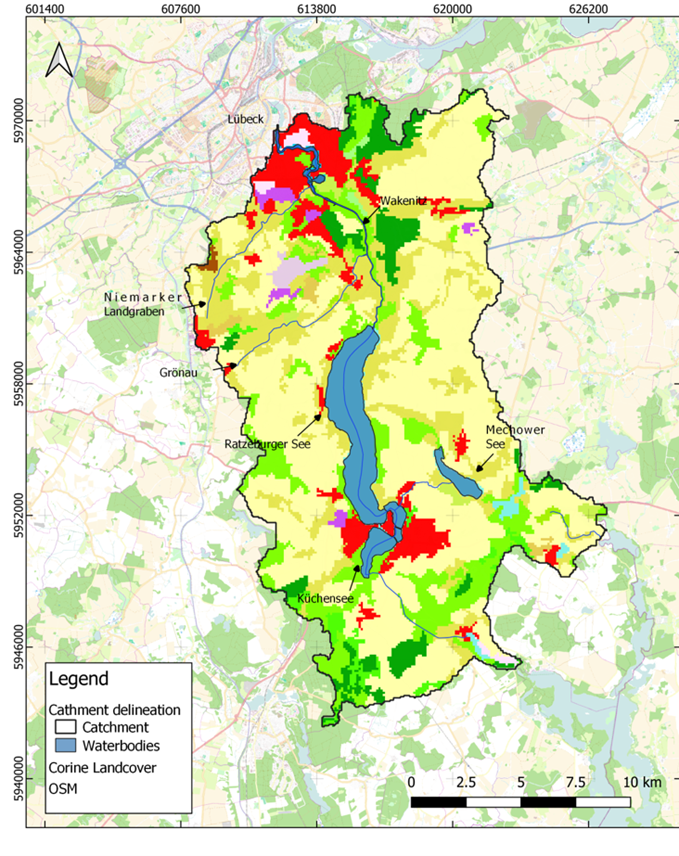

In [3]:
from IPython.display import Image, display
display(Image(filename=r"C:\Users\hendr\Documents\TH Lübeck\Semester 2\Hydrological Engineering\Project\Landuse Wakenitz.png"))


The catchment area of the Wakenitz. Legend: Settlement areas (red), forest areas (green with deciduous forest (light green) and coniferous forest (dark green)), as well as arable land (light brown) and pasture land and meadows (brown)(Endbericht 2021 Krähenteich, Mühlenteich, Wakenitz, n.d.)

The Wakenitz is primarily fed by Lake Ratzeburg, which has a total catchment area of approximately 320 km², of which 13% consists of lake and surface water. The region’s flat terrain and low elevation gradient result in slow-flowing water and the accumulation of organic matter. The river follows a non-uniform course, flowing through a series of interconnected lakes, man-made channels, and morphologically altered sections. Elevation across the basin ranges from about 4 meters above sea level (mNN) near Lübeck to 88 meters in the higher terrain surrounding Lake Ratzeburg (Figure 2). The climate of the Wakenitz area is characterized by mild winters and moderate summers. In the period between 1991 to 2021 the mean temperatures of 9.6 C and an annual average precipitation of 745mm were recorded(Klima Lübeck: Temperatur, Klimatabelle & Klimadiagramm Für Lübeck + Wetter, 2025).

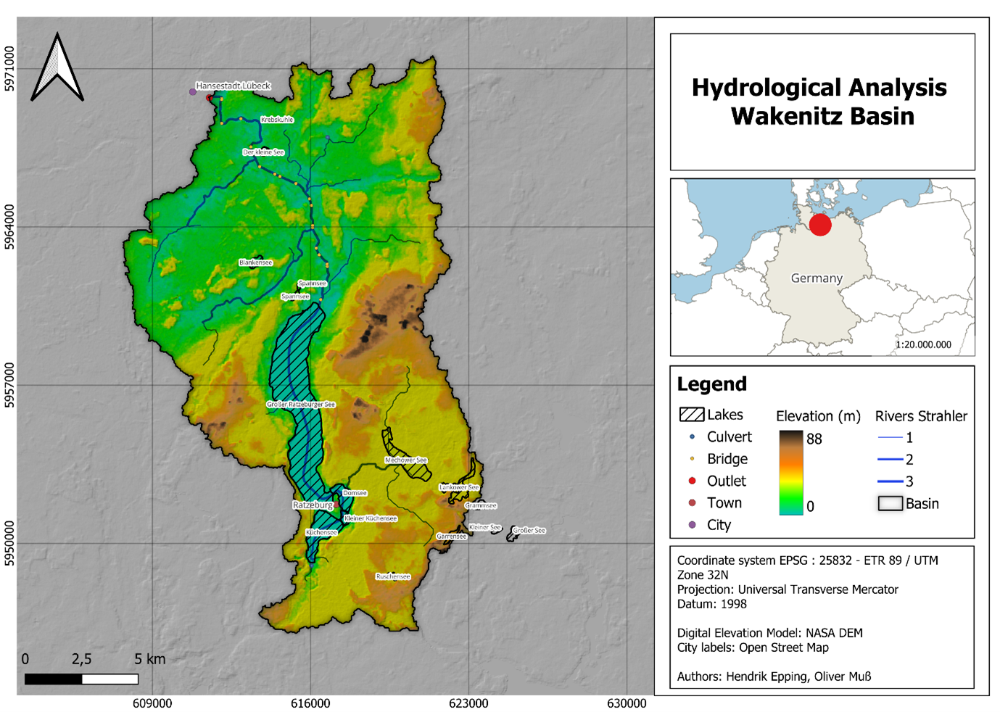

In [4]:
display(Image(filename=r"C:\Users\hendr\Documents\TH Lübeck\Semester 2\Hydrological Engineering\Project\Hydrological analysis wakenitz.png"))

Hydrologial Analysis Wakenitz basin

The town of Ratzeburg and the city Lübeck are located inside the basin of the Wakenitz. Multiple bridges span over the river (displayed as yellow dots). As previously mentioned, the Wakenitz inhabits multiple lakes along its way, the biggest being the Ratzeburger lake, the source of the Wakenitz, and along its flow path the Kleiner See. Since the flow at Kleiner See is minimal, and the excess of nutrients, a lot of biomass is produced in this area. These segments with low flow velocity act as nutrient sinks. Furthermore other tributaries flow into the Wakneitz, resulting in a Strahler river order ranging up to a class of 3. The Wakneitz main inflow is the Ratzeburger lake, which main water source is groundwater, which contributes substantial flow and input to the river. Other smaller tributaries connect to the Wakenitz after the Rothehusen gauge such as Grönau and Niemarker Landgraben from the west and Schattiner Bach, Lüdersdorfer Graben, Palinger Bach, and Herrnburger Landgraben from the east. With these inflows, the water discharge reaches up to 9 m3/s at the gauge next to the Railroad bridge, with variability depending on precipitation and seasonal inflows. Many of these tributaries have been structurally altered due to agricultural development, which resulted in straightened channels and reduced flood plains. Furthermore, the drainage ditches of the agricultural land are a significant source of nutrient inputs, especially nitrate and phosphate, which contribute to water quality degradation in the Wakenitz.
Furthermore, the river exhibits strong diurnal dissolved oxygen concentration, driven by aquatic plant photosynthesis. Recent years have seen multiple oxygen depletion events, particularly in summer months. These often correlate with heavy rainfall, algal blooms, and increased biological oxygen demand (BOD). For example, in June and July 2023, DO levels dropped to as low as 2.5 mg/L, considered critical for aquatic life.
Six distinct low-oxygen events were recorded between June and September 2023, typically lasting several days. These were triggered by combinations of meteorological conditions and heavy rainfall which led to external nutrient inputs due to and are now a recurring pattern each summer. The presence of toxic algal blooms, particularly cyanobacteria, has also been documented during these periods(Külls et al., n.d.).
Due to its elevational characteristics floods are not common at the Wakenitz.
Despite being part of a nature reserve, the Wakenitz has experienced significant ecological degradation. It is estimated that 30% of the current species are at risk of extinction. The characteristic reed vegetation is in decline, and the fish population, fauna and floral habitat are diminishing.


The river system begins at the outflow of the Ratzeburger See and extends approximately 14 km downstream to the Düker culvert. Monitoring points MP-Nr. 1–17 are considered, excluding side branches such as the Mühlenteich and Krähenteich.

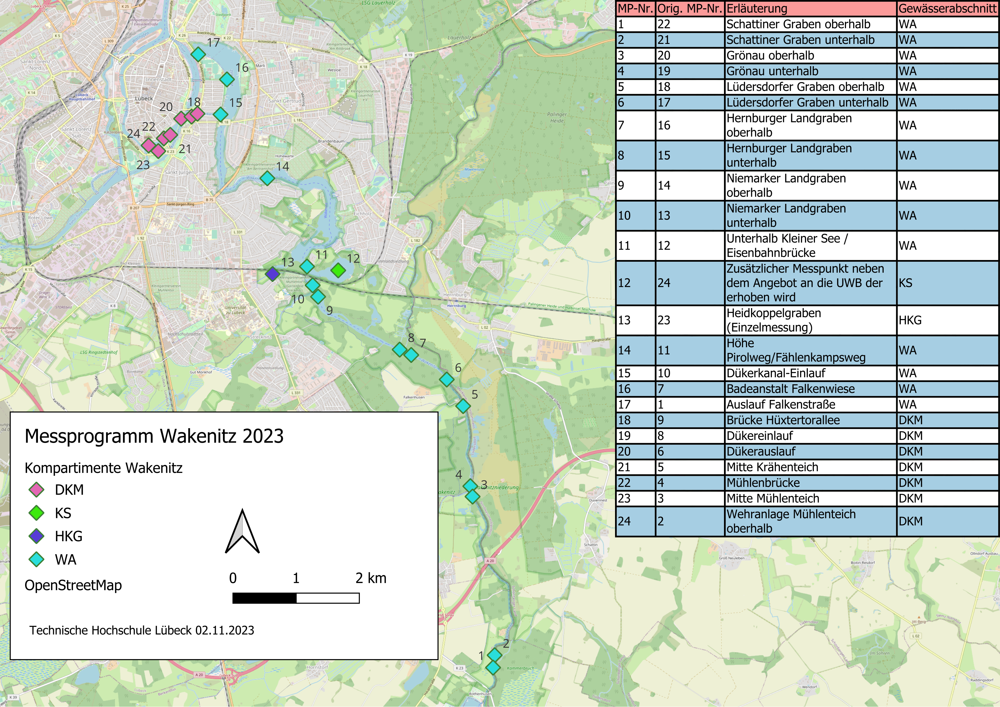

In [5]:
from IPython.display import Image, display

display(Image(filename=r"C:\Users\hendr\Documents\TH Lübeck\Semester 2\Hydrological Engineering\Project\00_Uebersichtskarte_Kompartimente_WA-2023.png"))

(Külls, 2023)

## DO BOD concentration along the Wakenitz
This data was taken from the report "Untersuchungen der Wasserqualität von Wakenitz, Krähenteich und Mühlenteich im Jahr 2022". 

Station  DO (mg/L)  BOD5 (mg/L)
   S-01       9.53          0.0
   S-02       8.51          0.0
   S-03       7.30          0.0
   S-04       6.55          0.0
   S-05       6.80          0.0
   S-06       7.95          0.0
   S-07       4.09          0.0
   S-08      10.06          0.0
   S-09      14.87          0.0
   S-10      13.23          0.0
   S-11      12.74          0.0


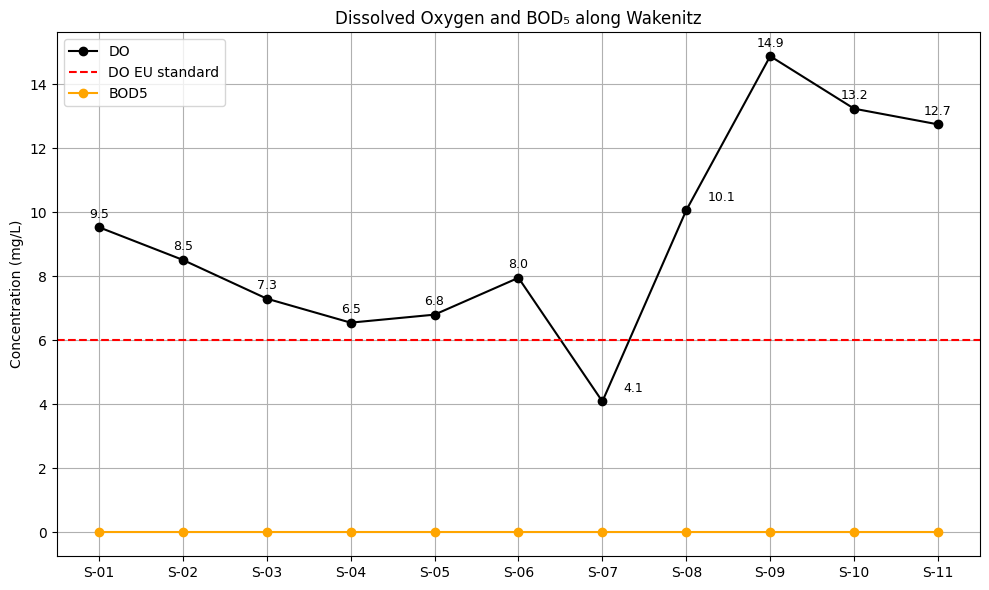

In [6]:
import pandas as pd
import matplotlib.pyplot as plt

# Create the data
data = {
    'Station': ['S-01', 'S-02', 'S-03', 'S-04', 'S-05', 'S-06', 'S-07', 'S-08', 'S-09', 'S-10', 'S-11'],
   # "Location" 
    'DO (mg/L)': [9.53, 8.51, 7.30, 6.55, 6.80, 7.95, 4.09, 10.06, 14.87, 13.23, 12.74],
    'BOD5 (mg/L)': [0.0]*11
}

# Display table
df = pd.DataFrame(data)
print(df.to_string(index=False))


# Plotting
plt.figure(figsize=(10, 6))

# Plot DO
plt.plot(df['Station'], df['DO (mg/L)'], marker='o', label='DO', color='black')

# Annotate each point
for i, val in enumerate(df['DO (mg/L)']):
    if i == 6:  # index of 4.09
        plt.text(i + 0.25, val + 0.2, f"{val:.1f}", ha='left', va='bottom', fontsize=9)
    elif i == 7:  # index of 10.06
        plt.text(i + 0.25, val + 0.2, f"{val:.1f}", ha='left', va='bottom', fontsize=9)
    else:
        plt.text(i, val + 0.2, f"{val:.1f}", ha='center', va='bottom', fontsize=9)

# Add EU standard line
plt.axhline(6, color='red', linestyle='--', label='DO EU standard')

# Plot BOD5
plt.plot(df['Station'], df['BOD5 (mg/L)'], marker='o', label='BOD5', color='orange')



# Labels and formatting
plt.ylabel('Concentration (mg/L)')
plt.title('Dissolved Oxygen and BOD₅ along Wakenitz')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()




The BOD5 measuremtents are 0 and the DO measurments show great variation.

## BOD measurements Wakenitz
Measurements of BOD5 (German BSB5) from the 20/09/2023 to 04/10/2023.


In [7]:
# Load the Excel file
df = pd.read_excel(r"C:\Users\hendr\Documents\TH Lübeck\Semester 2\Hydrological Engineering\Project\BSB5.xlsx")

# Clean column names
df.columns = df.columns.str.strip().str.replace('\n', ' ')

# Define the columns to print
columns_to_print1 = ['Nr.', 'ProbenID', 'Datum', 'Uhrzeit', 'Gewässer', 'Ort', 'BSB5 [mg/l]']

# Print the selected columns as a single table
print(df[columns_to_print1].to_string(index=False))




                      Nr.    ProbenID      Datum  Uhrzeit    Gewässer                        Ort BSB5 [mg/l]
                        1 HL_MP_22.10 2023-09-20      NaN    Wakenitz Schattiner Graben oberhalb           0
                        2 HL_MP_19.10 2023-09-20      NaN    Wakenitz           Grönau unterhalb           0
                        3  HL_MP_1.10 2023-09-20      NaN    Wakenitz         Auslauf Falkendamm         3.3
                        4  HL_MP_3.10 2023-09-20      NaN    Wakenitz          Mitte Krähenteich         0.6
                        5  HL_MP_5.10 2023-09-20      NaN    Wakenitz          Mitte Mühlenteich         0.8
                        6  HL_KS_1.10 2023-09-20      NaN Kleiner See                Kleiner See         0.6
Second measuring campaign         NaN        NaT      NaN         NaN                        NaN         NaN
                        1 HL_MP_22.11 2023-10-04      NaN    Wakenitz Schattiner Graben oberhalb           0
                   

For the oxygen concentraion there are a lot of data present, however for the BOD the information is sparse. Therefor the case study was done for those two measuring compaigns.The information from the tables were used to model the oxygen concnetration startin at Schattinger Graben oberhalb until Auslauf Falkendamm.

# Code/Results

## Old Code

### Define Parameters

### Given parameters from the modeller:
Cs = 9     # mg/L
C0 = 7     # mg/L
L0 = 20   # mg/L
kd = 0.2  # 1/hr
kr = 0.3   # 1/hr
U = 2      # km/hr

### Used parameters from the Wakenitz

In [8]:
Cs = 9     # mg/L
C0 = 10.07    # mg/L
L0 = 0   # mg/L
kd = 0.017816  # 1/hr
kr = 0.02672   # 1/hr
U = 1.8      # km/hr

To incorporate the model in Python, functions are defined for DO and BOD. The NumPy library is needed to access math functions and develop arrays. 

In [9]:
# import the numpy library using np "alias" to shorten the amount of code writing
import numpy as np

# define the BOD function
def Lx(x, L0, kd, U): 
    return L0 * np.exp(-1 * kd * x / U)

# define the DO function
def C(x, Cs, C0, L0, kd, kr, U):
    return Cs - (kd * L0 / (kr - kd) * (np.exp(-kd*x/U) - np.exp(-kr*x/U)) + (Cs - C0) * np.exp(-kr*x/U))

To apply the model, it's easiest to make an array of $x$ values representing points in a river using numpy's "arange" function, which provides values given the (start, end, increment) arguments.

In [10]:
x = np.arange(0,800,0.2)  # km

The BOD and DO at every point $x$ in the river can be determined using the functions. An array of uniform values for a "critical" DO level of 5 mg/L for the river is also constructed.

In [11]:
BOD = Lx(x, L0, kd, U)                  # array of BOD values in mg/L
DO = C(x, Cs, C0, L0, kd, kr, U)  # array of DO values in mg/L
critical = 5 * np.ones(len(x))         # array of critical DO values in mg/L

The matplotlib library is used to plot the results, including a line showing a critical DO of 5 mg/L for this river.

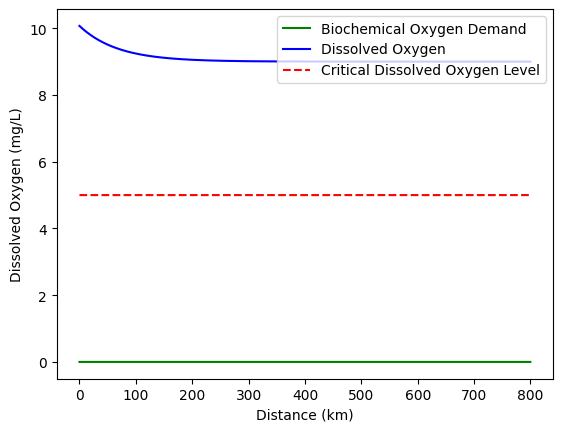

In [12]:
%matplotlib inline
import matplotlib.pyplot as plt

plt.plot(x,BOD, 'g-', label = "Biochemical Oxygen Demand")
plt.plot(x,DO, 'b-', label = "Dissolved Oxygen")
plt.plot(x,critical, 'r--', label = "Critical Dissolved Oxygen Level")
plt.xlabel("Distance (km)")
plt.ylabel("Dissolved Oxygen (mg/L)")
leg = plt.legend()

This graph was created using data from the Wakenitz River. Please note that the Wakenitz is only 15 km long and not hydrologically homogeneous, which affects the visual appearance and clarity of the results. Even with the updated code—including the calculation of the coefficients ka and kd, no significant differences are observed when focusing only on the first 15 km.

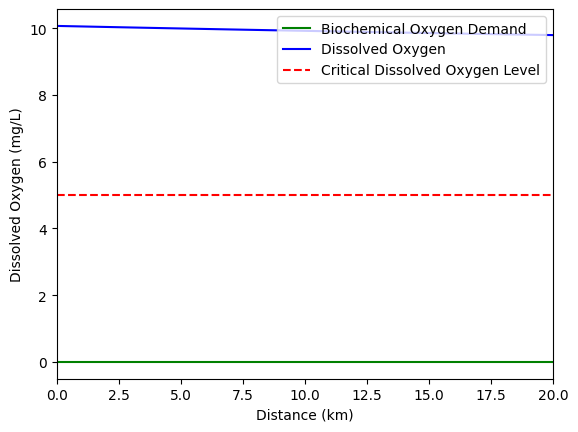

In [13]:
plt.plot(x, BOD, 'g-', label="Biochemical Oxygen Demand")
plt.plot(x, DO, 'b-', label="Dissolved Oxygen")
plt.plot(x, critical, 'r--', label="Critical Dissolved Oxygen Level")

plt.xlabel("Distance (km)")
plt.ylabel("Dissolved Oxygen (mg/L)")
plt.xlim(0, 20)  # Limit x-axis from 0 to 20 km

plt.legend()
plt.show()


## Updated Code

The paper "Basic river water quality models" from Dr. Géza Jolánkai explains how the ka and kr rate are detemined and the relation between these two coefficients.

### Determination of K2/ka
Rearation rate ka/k2
This equation is an estimate from various papers.
$$
K_2 = 2.148 \times v^{0.878} \times H^{-1.48}
$$

Where:

$K_2$ is the reaeration rate coefficient, the rate at which oxygen enters the water from the atmosphere, (day^-1) 

$v$ is the average flow velocity in the river reach, (m/s) 

$H$ is the average depth of flow over the river reach, (m)



In [14]:
# Define the variables
v = 0.5     # m/s at the inflow from Ratzeburger lake, if you go more downstream the lower the flow gets
H = 1.5   # m 1m at Rothenhusen, slowly increases up to 2.5m at car bridge

# Calculate K_2
kr_day = 2.148 * (v ** 0.878) * (H ** -1.48)

#Convert Kr from day ^-1 to hr^-1

kr = kr_day/24

# Display the result
print("kr =", kr, "h^-1")



kr = 0.026724133692111424 h^-1


### Determination of K1/Kd
There is a corelation between kd and kr. Expressed by this table from Jolankai 1979.  This Table expresses the ratio f= K2/K1(kr/kd), in function of the verbally described hydraulic condition of the stream. The ratio varies depending on the literature.


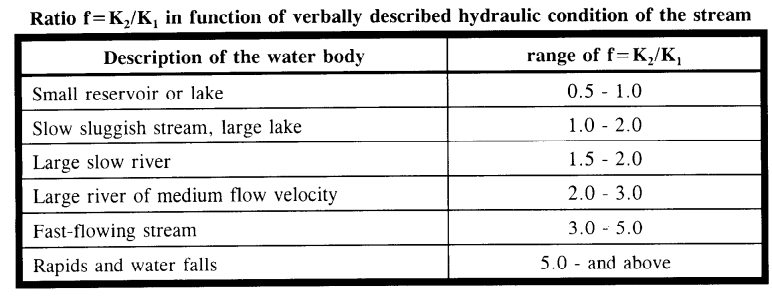

In [15]:
from IPython.display import Image, display

display(Image(filename=r"C:\Users\hendr\Documents\TH Lübeck\Semester 2\Hydrological Engineering\Project\K2K1 ratio table.png"))


As the Wakenitz is a slow sluggish stream, f is chosen to be 1.5. This gives a K1 value of:

In [16]:
#f = 1.5
#f = K_2/K_1
kd = kr/1.5
print ("kd=", kd, "h^-1")

kd= 0.017816089128074284 h^-1


### Critical Point
Calculate the critical distance x_c downstream where oxygen deficit is maximum.

In [17]:
import numpy as np

def critical_point(U, kd, kr):
 
    if kd == kr:
        raise ValueError
    if kd <= 0 or kr <= 0 or U <= 0:
        raise ValueError

    x_c = (U / (kr - kd)) * np.log(kr / kd)
    return x_c



# Compute critical point
x_critical = critical_point(U, kd, kr)
print(f"Critical point: {x_critical:.2f} km")


Critical point: 81.93 km


This means that the point with the maximum deficit in oxygen in the Wakenitz is at 81.93km, which is impossible due to the limited length off 14km.

# Interactive model

The original code by David Lampert is a simple implementation of the Streeter-Phelps model, used to calculate BOD and dissolved oxygen concentrations along a river’s length. It requires predefined input values and produces a single static graph per run. To change any parameters, the entire model must be re-executed. To improve usability,the model was enhanced by incorporating interactive sliders. These allow users to dynamically adjust key parameters such as stream type, mean depth, flow velocity, Initial DO, Initial BOD, DO Saturation, and Critical DO.

One of the main challenges in applying this model lies in accurately estimating the input parameters—particularly the BOD degradation rate (Kd) and the oxygen reaeration rate (Kr). A literature review revealed a wide range of approaches to estimating these values. The paper 'Basic River Water Quality Models' by Dr. Géza Jolánkai provides a comprehensive summary of these methods and proposes a combined empirical formula for estimating Kr based on average flow velocity and river depth. Additionally, it describes a relationship between Kr and Kd, dependent on the river’s flow regime.

These empirical relationships have been integrated into the updated interactive model, making it not only more accessible but also a valuable teaching tool for understanding the dynamics of oxygen balance in streams. The model also calculates the river’s critical point—defined as the location with the lowest dissolved oxygen concentration—highlighting the section of the river most affected by pollution.

In [18]:
import numpy as np
import matplotlib.pyplot as plt
from ipywidgets import interact, FloatSlider, Dropdown, Layout, VBox, Label


# Streeter–Phelps model functions
def Lx(x, L0, kd, U):
    return L0 * np.exp(-kd * x / U)

def C(x, Cs, C0, L0, kd, kr, U):
    return Cs - (kd * L0 / (kr - kd) * (np.exp(-kd * x / U) - np.exp(-kr * x / U)) + (Cs - C0) * np.exp(-kr * x / U))

def critical_point(U, kd, kr):
    if kd == kr or kd <= 0 or kr <= 0:
        return None
    return (U / (kr - kd)) * np.log(kr / kd)

# Flow type presets (f = kr/kd)
flow_types = {
    "Small reservoir or lake": 0.75,
    "Slow sluggish stream, large lake": 1.5,
    "Large slow river": 1.75,
    "Large river of medium flow v": 2.5,
    "Fast-flowing stream": 4.0,
    "Rapids and waterfalls": 5.0
}

# Main plotting function
def plot_streeter(C0, L0, Cs, velocity, depth, critical_DO, flow_type):
    f_ratio = flow_types[flow_type]
    
    # Calculate kr and kd
    kr_day = 2.148 * (velocity ** 0.878) / (depth ** 1.48)
    kr = kr_day / 24
    kd = kr / f_ratio
    U = velocity * 3.6  # m/s → km/hr

    x = np.arange(0, 10000.1, 0.2)
    DO = C(x, Cs, C0, L0, kd, kr, U)
    BOD = Lx(x, L0, kd, U)
    critical_line = np.full_like(x, critical_DO)

    x_crit = critical_point(U, kd, kr)
    C_crit = C(x_crit, Cs, C0, L0, kd, kr, U) if x_crit and 0 <= x_crit <= x.max() else None

    window_width = 1000  # total width of the graph

    plt.figure(figsize=(10, 6))
    plt.plot(x, DO, label="Dissolved Oxygen", color='blue')
    plt.plot(x, BOD, label="Biochemical Oxygen Demand", color='green')
    plt.plot(x, critical_line, 'r--', label=f"Critical DO = {critical_DO:.1f} mg/L")

    if x_crit and C_crit:
        plt.plot(x_crit, C_crit, 'ro')
        plt.annotate(
            f"Critical Point\nx ≈ {x_crit:.1f} km\nDO ≈ {C_crit:.2f} mg/L",
            xy=(x_crit, C_crit),
            xytext=(x_crit + 5, C_crit + 1),
            arrowprops=dict(arrowstyle="->", color="red"),
            bbox=dict(boxstyle="round", fc="mistyrose", ec="red"),
            fontsize=10
        )
        plt.xlim(max(0, x_crit - window_width / 2), x_crit + window_width / 2)
        plt.ylim(0, max(C_crit + 5, DO.max(), BOD.max(), critical_DO) + 2)
    else:
        plt.xlim(0, 15)
        plt.ylim(0, max(DO.max(), BOD.max(), critical_DO) + 2)

    plt.xlabel("Distance downstream (km)")
    plt.ylabel("Concentration (mg/L)")
    plt.title(
        f"Streeter–Phelps Simulation\n"
        f"{flow_type} | f = {f_ratio:.2f} | v = {velocity:.2f} m/s | H = {depth:.2f} m | Cₛ = {Cs:.1f} mg/L"
    )
    plt.legend()
    plt.grid(True)
    plt.tight_layout()
    plt.show()

# Interactive interface
interact(
    plot_streeter,
 
    C0=FloatSlider(value=7.0, min=5.0, max=10.0, step=0.1, description="Initial DO [mg/L]"),
    L0=FloatSlider(value=20.0, min=0.0, max=30.0, step=0.5, description="Initial BOD [mg/L]"),
    Cs=FloatSlider(value=9.0, min=6.0, max=14.6, step=0.1, description="DO Saturation Cₛ [mg/L]"),
    velocity=FloatSlider(value=0.5, min=0.1, max=2.0, step=0.05, description="Flow velocity [m/s]"),
    depth=FloatSlider(value=1.5, min=0.5, max=10.0, step=0.1, description="Mean depth [m]"),
    critical_DO=FloatSlider(value=5.0, min=3.0, max=10.0, step=0.1, description="Critical DO [mg/L]"),
    flow_type=Dropdown(
        options=list(flow_types.keys()),
        value="Slow sluggish stream, large lake",
        description="Flow regime"

    )
);



interactive(children=(FloatSlider(value=7.0, description='Initial DO [mg/L]', max=10.0, min=5.0), FloatSlider(…

# Discussion

The initial idea was to apply the Streeter-Phelps model to simulate dissolved oxygen (DO) and biochemical oxygen demand (BOD) concentrations in the Wakenitz River. However, when plotting the model output, meaningful results were only obtained over a distance of approximately 400 km—while the Wakenitz itself is only 14 km long. At this scale, the model output is difficult to interpret and not suitable for analysis.

Furthermore, when comparing the modeled data to actual measurements, large spikes in DO concentration were observed in the measured data, which the model could not replicate. As for BOD, very few measurements were available, and most of the recorded values were close to zero. This lack of data makes it impossible to realistically model BOD degradation over time.

Another challenge is that the Wakenitz is not a hydrologically homogeneous river. From the Ratzeburger See to the Düker, the river undergoes several transitions in flow characteristics, habitat conditions, and includes small subsystems like the Kleiner See. These variations make it difficult to represent the river accurately using a simplified, uniform model like Streeter-Phelps.

# Conclusion

The Streeter–Phelps model was applied to simulate dissolved oxygen (DO) and biochemical oxygen demand (BOD) dynamics along the Wakenitz River. While the model effectively illustrates the theoretical oxygen sag curve and the relation between BOD degradation and atmospheric re-aeration, its practical application to the Wakenitz is limitied due to the charectistics of the Wakenitz.

The Wakenitz River, at approximately 14 km in length, is too short and hydrologically heterogeneous for the model to produce meaningful results. The calculated critical point of oxygen deficit lies far beyond the river’s actual length, and the model output showed no significant change in DO or BOD concentrations within the range of the Wakenitz. The Streeter–Phelps model is better suited for longer, more uniform rivers, where its assumptions—such as constant flow and uniform degradation rates—are more valid.

Despite the constraints of the Wakenitz, the model remains a useful tool for educational purpose, using the interactive graph to showcase how different parameters affect the BOD and DO along a homogenous river.

# References

Basic river water quality models. (n.d.).

Endbericht 2021 Krähenteich, Mühlenteich, Wakenitz.pdf. (n.d.). Retrieved 20 June 2025, from https://lernraum.th-luebeck.de/pluginfile.php/678112/mod_resource/content/1/Endbericht%202021%20Kr%C3%A4henteich%2C%20M%C3%BChlenteich%2C%20Wakenitz.pdf

Külls, D. C., & Kock, M. (n.d.). Untersuchungen der Wasserqualität von Wakenitz, Krähenteich und Mühlenteich im Jahr 2023.

Lampert, D. (2023). Djlampert/StreeterPhelps [HTML]. https://github.com/djlampert/StreeterPhelps (Original work published 2019)



# Appendix

## DO concentration Wakenitz
Measurements of the DO concentration and possible other factors from 17/05/2023 to 04/10/2023 at the Wakenitz.

In [19]:
import pandas as pd
import matplotlib.pyplot as plt

# Load Excel file
df = pd.read_excel(r"C:\Users\hendr\Documents\TH Lübeck\Semester 2\Hydrological Engineering\Project\Ergebnisse Wasserqualität Wakenitz 2023.xlsx")

# Clean up column names
df.columns = df.columns.str.strip().str.replace('\n', ' ')

# Print available columns
columns_to_print = ['Nr.', 'ProbenID', 'Datum', 'Uhrzeit', 'Gewässer', 'Ort', 'O2 [ppm]', 'O2 [%]']
print(df[columns_to_print].to_string(index=False))



# other measurements: 'Temp\n[°C]', 'pH \n[-]', 'ORP\n[mV]', 'Leitf. \n[µS/cm]', 'Press.\n[psi]',


 Nr.    ProbenID      Datum  Uhrzeit         Gewässer                            Ort  O2 [ppm]  O2 [%]
   1  HL_MP_22.1 2023-05-17 08:34:26         Wakenitz     Schattiner Graben oberhalb     10.07   95.20
   2  HL_MP_21.1 2023-05-17 08:42:35         Wakenitz    Schattiner Graben unterhalb      9.80   92.70
   3  HL_MP_20.1 2023-05-17 08:59:48         Wakenitz                Grönau oberhalb     10.02   95.10
   4  HL_MP_19.1 2023-05-17 09:05:38         Wakenitz               Grönau unterhalb     10.04   95.10
   5  HL_MP_18.1 2023-05-17 09:18:24         Wakenitz   Lüdersdorfer Graben oberhalb      9.51   91.40
   6  HL_MP_17.1 2023-05-17 09:26:43         Wakenitz  Lüdersdorfer Graben unterhalb      9.62   92.70
   7  HL_MP_16.1 2023-05-17 09:37:01         Wakenitz    Herrnburger Graben oberhalb      9.61   93.30
   8  HL_MP_15.1 2023-05-17 09:42:54         Wakenitz   Herrnburger Graben unterhalb      9.60   93.10
   9  HL_MP_14.1 2023-05-17 09:55:34         Wakenitz  Niemarker Landgrab